In [1]:
# --- Imports & config ---
import os, glob, re
from pathlib import Path
from typing import Tuple

import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device:", device)




Device: cuda


In [9]:
# --- Paths (edit if needed) ---
data_root = r"C:\Users\User\Desktop\Final project comp3710\keras_slices_data"
img_val_dir   = os.path.join(data_root, 'keras_slices_validate')
seg_val_dir   = os.path.join(data_root, 'keras_slices_seg_validate')
img_test_dir  = os.path.join(data_root, 'keras_slices_test')
seg_test_dir  = os.path.join(data_root, 'keras_slices_seg_test')

#ckpt_path = r"C:\Users\User\Desktop\Final project comp3710\PatternAnalysis-2025\models\unet2d_hipmri_best.pth"  # saved weights


ckpt_path =r"C:\Users\User\Desktop\Final project comp3710\PatternAnalysis-2025\recognition\Project2\models\unet2d_hipmri_best.pth"

for p in [img_val_dir, seg_val_dir, img_test_dir, seg_test_dir]:
    print(p, "OK" if os.path.isdir(p) else "MISSING")

print("Checkpoint exists:", os.path.exists(ckpt_path))


C:\Users\User\Desktop\Final project comp3710\keras_slices_data\keras_slices_validate OK
C:\Users\User\Desktop\Final project comp3710\keras_slices_data\keras_slices_seg_validate OK
C:\Users\User\Desktop\Final project comp3710\keras_slices_data\keras_slices_test OK
C:\Users\User\Desktop\Final project comp3710\keras_slices_data\keras_slices_seg_test OK
Checkpoint exists: True


In [11]:
# --- Dataset (pair by trailing slice id; resize to 256x256) ---
DEF_PROSTATE_LABEL = 3
_TRAIL_PAT = re.compile(r'(\d+_week_\d+_slice_\d+)$')

def _slice_key_from_stem(stem: str) -> str:
    m = _TRAIL_PAT.search(stem)
    if m: return m.group(1)
    if stem.startswith("case_"): return stem[len("case_"):]
    if stem.startswith("seg_"):  return stem[len("seg_"):]
    return stem

def _slice_key(p: Path) -> str:
    return _slice_key_from_stem(p.stem)

class HipMRIDataset(Dataset):
    def __init__(self, img_dir: str, seg_dir: str, prostate_label: int = DEF_PROSTATE_LABEL,
                 target_size=(256,256)):
        self.target_size = tuple(target_size)
        img_paths = sorted([Path(p) for p in glob.glob(os.path.join(img_dir, '**', '*.nii'), recursive=True)])
        seg_paths = sorted([Path(p) for p in glob.glob(os.path.join(seg_dir, '**', '*.nii'), recursive=True)])
        if len(img_paths) == 0 or len(seg_paths) == 0:
            raise RuntimeError(f"No .nii files found.\n  {img_dir}\n  {seg_dir}")

        img_map = { _slice_key(p): p for p in img_paths }
        seg_map = { _slice_key(p): p for p in seg_paths }
        common = sorted(set(img_map.keys()) & set(seg_map.keys()))
        if len(common) == 0:
            raise RuntimeError("No matching image/seg pairs found. Check naming/regex.")

        self.pairs = [(img_map[k], seg_map[k]) for k in common]
        self.prostate_label = prostate_label

    def __len__(self): return len(self.pairs)

    def __getitem__(self, idx):
        img_path, seg_path = self.pairs[idx]
        img = nib.load(str(img_path)).get_fdata().astype(np.float32)
        seg = nib.load(str(seg_path)).get_fdata()
        seg = np.rint(seg).astype(np.int64)

        # normalize
        img = (img - img.mean()) / (img.std() + 1e-8)
        img = (img - img.min()) / (img.max() - img.min() + 1e-8)

        # binary mapping
        seg = (seg == self.prostate_label).astype(np.int64)

        # to tensors
        img_t = torch.from_numpy(img[None, ...]).float()    # (1,H,W)
        seg_t = torch.from_numpy(seg[None, ...]).float()    # (1,H,W) float for interpolate

        # resize to fixed size
        H, W = self.target_size
        img_t = F.interpolate(img_t.unsqueeze(0), size=(H, W), mode='bilinear', align_corners=False).squeeze(0)
        seg_t = F.interpolate(seg_t.unsqueeze(0), size=(H, W), mode='nearest').squeeze(0)
        seg_t = seg_t.squeeze(0).long()  # (H,W) in {0,1}
        return img_t, seg_t


In [12]:
# --- Model (must match training) ---
class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.LeakyReLU(0.01, inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.LeakyReLU(0.01, inplace=True),
        )
    def forward(self, x): return self.net(x)

class UNet2D(nn.Module):
    def __init__(self, n_classes=2, base=64):
        super().__init__()
        self.inc   = DoubleConv(1, base)
        self.down1 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(base,   base*2))
        self.down2 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(base*2, base*4))
        self.down3 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(base*4, base*8))
        self.up1   = nn.ConvTranspose2d(base*8, base*4, 2, stride=2)
        self.conv1 = DoubleConv(base*8, base*4)
        self.up2   = nn.ConvTranspose2d(base*4, base*2, 2, stride=2)
        self.conv2 = DoubleConv(base*4, base*2)
        self.up3   = nn.ConvTranspose2d(base*2, base,   2, stride=2)
        self.conv3 = DoubleConv(base*2, base)
        self.outc  = nn.Conv2d(base, n_classes, 1)
    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x  = self.up1(x4)
        x  = torch.cat([x, x3], dim=1); x = self.conv1(x)
        x  = self.up2(x)
        x  = torch.cat([x, x2], dim=1); x = self.conv2(x)
        x  = self.up3(x)
        x  = torch.cat([x, x1], dim=1); x = self.conv3(x)
        return self.outc(x)


In [13]:
# --- Dice & helpers ---
def dice_binary_from_logits(logits: torch.Tensor, target: torch.Tensor, eps: float = 1e-6) -> float:
    probs = torch.softmax(logits, dim=1)[:, 1]  # foreground prob
    pred  = (probs > 0.5).long()
    target = target.long()
    intersection = (pred & target).sum(dim=(1,2)).float()
    union       = pred.sum(dim=(1,2)) + target.sum(dim=(1,2))
    return ((2*intersection + eps) / (union + eps)).mean().item()

@torch.no_grad()
def evaluate_dice(model: nn.Module, loader: DataLoader) -> float:
    model.eval()
    total = 0.0
    for imgs, segs in loader:
        imgs, segs = imgs.to(device), segs.to(device)
        logits = model(imgs)
        total += dice_binary_from_logits(logits, segs)
    return total / max(1, len(loader))

@torch.no_grad()
def show_samples(model, dataset, k=3):
    model.eval()
    plt.figure(figsize=(12, 4*k))
    for i in range(k):
        img, seg = dataset[i]
        logits = model(img.unsqueeze(0).to(device))
        pred = torch.argmax(logits, dim=1).cpu().squeeze()
        ax1 = plt.subplot(k, 3, 3*i+1); ax1.imshow(img.squeeze().numpy(), cmap='gray'); ax1.set_title('Input'); ax1.axis('off')
        ax2 = plt.subplot(k, 3, 3*i+2); ax2.imshow(seg.numpy(), cmap='jet');         ax2.set_title('GT');    ax2.axis('off')
        ax3 = plt.subplot(k, 3, 3*i+3); ax3.imshow(pred.numpy(), cmap='jet');        ax3.set_title('Pred');  ax3.axis('off')
    plt.tight_layout(); plt.show()


In [14]:
# --- Data (no training here) ---
val_dataset  = HipMRIDataset(img_val_dir,  seg_val_dir,  target_size=(256,256))
test_dataset = HipMRIDataset(img_test_dir, seg_test_dir, target_size=(256,256))

val_loader  = DataLoader(val_dataset,  batch_size=4, shuffle=False, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, num_workers=0)

print(f"Val: {len(val_dataset)} | Test: {len(test_dataset)}")
img0, seg0 = test_dataset[0]
print("Sample shapes:", tuple(img0.shape), tuple(seg0.shape), "labels", int(seg0.min()), "…", int(seg0.max()))


Val: 660 | Test: 540
Sample shapes: (1, 256, 256) (256, 256) labels 0 … 1


In [15]:
# --- Load trained weights & evaluate ---
model = UNet2D(n_classes=2).to(device)
state = torch.load(ckpt_path, map_location=device)
model.load_state_dict(state)
model.eval()

val_dice  = evaluate_dice(model, val_loader)
test_dice = evaluate_dice(model, test_loader)
print(f"VAL  Dice (prostate): {val_dice:.4f}")
print(f"TEST Dice (prostate): {test_dice:.4f}")


VAL  Dice (prostate): 0.8895
TEST Dice (prostate): 0.9565


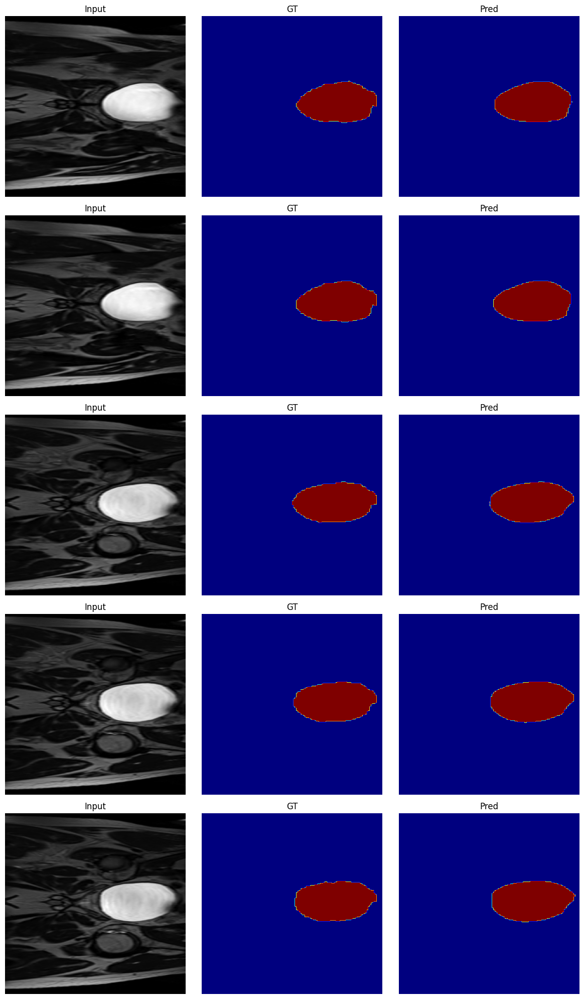

In [17]:
# --- Visualise ---
show_samples(model, test_dataset, k=5)


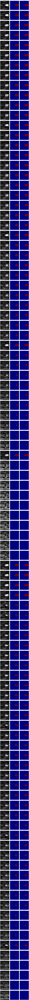

In [18]:
# --- Visualise ---
show_samples(model, test_dataset, k=100)